# Random walk of particles on a 2D lattice
Simulation of random walking particles on a 2D lattice. In each timestep, every particle randomly moves to one of its 8 neigbouring lattice sites. If all potential lattice sites are occupied, nothing happens. This is a computational inexpensive way to model simple diffusion dynamics (see https://en.wikipedia.org/wiki/Diffusion).   

### Import Packages 

In [63]:
import Random as r
using Plots

### Set Parameters

In [64]:
dim = 100                                       #size of system
half_dim = Int(round(dim/2))                    #help variabel to populate system
space = zeros(Int,dim,dim)                      #initialize grid
start_proportion = 0.1                          #percentatge of occupied grid points  
start_size = Int(round(dim*start_proportion))   #edge length of squared starting area of the particles 
particle_list = []                                
pa_number = start_size^2                         
timesteps = 1000;


### Initialize system
Populate center square of the sytem with particles, save particle positions additionaly in particle list

In [65]:
for y = 1:dim
    if (y-half_dim) <= start_size && (y-half_dim) > -start_size
        for x = 1:dim
            if (x-half_dim) <= start_size && (x-half_dim) > -start_size
                space[y,x] = 1
                push!(particle_list, [y,x])
            end
        end
        
    end
end

### Display start config
create arrray with all y and x positions of particles out of particle list as an input for scatter plot

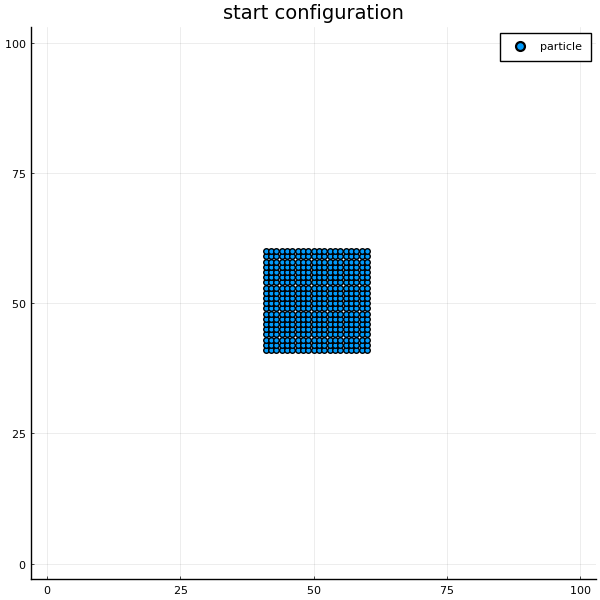

In [66]:
pa_y = [i[2] for i in particle_list]
pa_x = [i[1] for i in particle_list]
# use the Plots.jl package for plotting. nice tutorial available at https://docs.juliaplots.org/latest/tutorial/
u = plot(
    pa_x,
    pa_y, 
    seriestype = :scatter,
    title = "start configuration",
    xlim = [0,dim], 
    ylim = [0,dim],
    markersize =4,
    size = (600,600),
    label ="particle"
    )

### Update Function


In [67]:
iterations = [[0,1],[0,-1],[1,0],[-1,0],[1,1],[-1,-1],[-1,1],[1,-1]]  #iterations are possible movement vectors to the next gridpoint
acces_vector = [1:8;]
particle_list_full =[]

@time begin                                                     # @time macro returns computation time 
    for t = 1:timesteps
        for i in particle_list
            acces_vector = r.shuffle(acces_vector)              # access vector is shuffled to ensure random movement path of particle
            for v = 1:(length(acces_vector)) 
                a = i[1]+iterations[acces_vector[v]][1] 
                b = (i[2]+iterations[acces_vector[v]][2])       # [a,b] is the next gridpoint to move to
                if a >= 1 && a <= dim && b >= 1 && b <= dim     # check if gridpoint is out of bounds of array
                    if space[a,b] == 0 && space[i[1],i[2]] == 1 # check if target grid pointif gridpoint is emtpy, particle moves 
                        space[i[1],i[2]]= 0                     # clear previous position
                        space[a,b] = 1                          # move in new position

                        i[1] += iterations[acces_vector[v]][1]  # update particle list
                        i[2] += iterations[acces_vector[v]][2]
                        break                                   # break loop if particle has moved
                    end
                end    
            end
        end
        a = deepcopy(particle_list)     
        push!(particle_list_full,a)                             # save current state of system 
    end
end

  0.506235 seconds (2.06 M allocations: 156.834 MiB)


### Transform particle list
create arrray with all y and x positions in every time step of all particles out of particle list as an input for scatter plot

In [68]:
pa_y_full =[]
pa_x_full =[]
for h = 1:timesteps
    push!(pa_y_full , [i[2] for i in particle_list_full[h]])
    push!(pa_x_full , [i[1] for i in particle_list_full[h]])
end
        

### Create animation 
using the macro @animate from the Plots package 

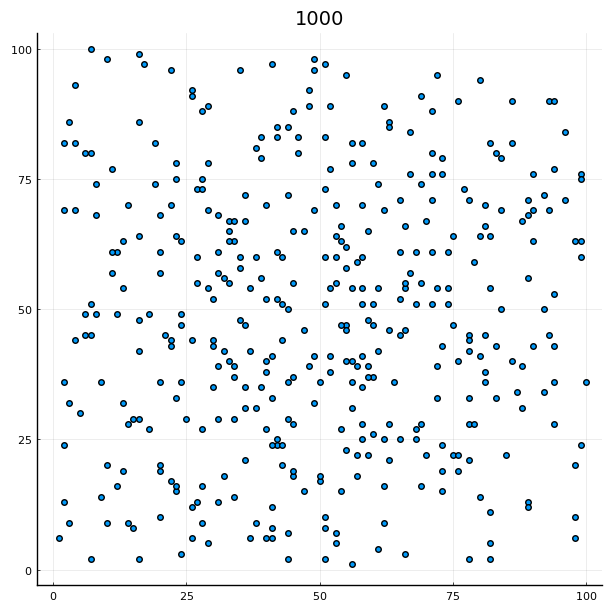

130.900802 seconds (33.35 M allocations: 973.090 MiB, 0.11% gc time)

┌ Info: Saved animation to 
│   fn = C:\Users\ank10ki\Dropbox\phd\Julia_test\First_trys\100_particles_1000_timesteps.gif
└ @ Plots C:\Users\ank10ki\.julia\packages\Plots\iYDwd\src\animation.jl:104


Plots.AnimatedGif("C:\\Users\\ank10ki\\Dropbox\\phd\\Julia_test\\First_trys\\100_particles_1000_timesteps.gif")
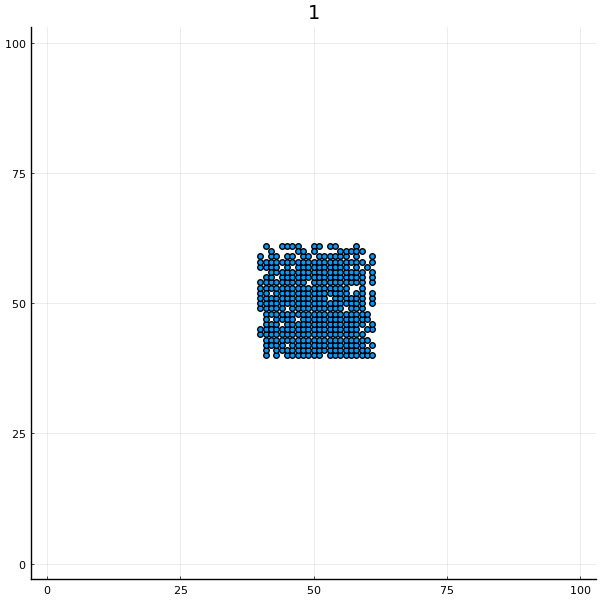

In [69]:
@time begin
    anim = @animate for j = 1:1:timesteps
        plot(pa_x_full[j],
             pa_y_full[j], 
            seriestype = :scatter,
            lims = [0,dim],
            legend=false,
            markersize = 4,
            title = j,
            size = (600,600),
            label ="particle" )

        end

    gif(anim,(string(pa_number)* "_particles_" *string(timesteps)*"_timesteps.gif"), fps = 30)
    # .gif in file name can be changed to .mp4 or .mov to create movie instead of gif 
end